In [ ]:
!pip install -q git+https://github.com/tensorflow/examples.git

  Preparing metadata (setup.py) ... done


In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds
import os
import time
import matplotlib.pyplot as plt
from IPython.display import clear_output
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from tensorflow_examples.models.pix2pix import pix2pix


AUTOTUNE = tf.data.AUTOTUNE  # 데이터 전처리 시 자동 병렬 처리를 사용하여 속도를 최적화합니다.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import zipfile
zip_file_path = '/content/drive/MyDrive/City/archive.zip'

# zip 파일을 열고 압축을 풀기
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall('/content/images')

In [ ]:
# 훈련용 낮뷰 데이터셋 로드
train_day_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    '/content/images/data/1',
    batch_size=None,          # 배치 크기 설정하지 않음
    label_mode=None,
    validation_split=0.1,     # 10%는 검증용
    subset='training',        # 훈련 데이터셋
    seed=88                   # 랜덤 시드
)

# 훈련용 밤뷰 데이터셋 로드
train_night_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    '/content/images/data/0',
    batch_size=None,          # 배치 크기 설정하지 않음
    label_mode=None,
    validation_split=0.1,     # 10%는 검증용
    subset='training',        # 훈련 데이터셋
    seed=88                   # 랜덤 시드
)

# 검증용 낮뷰 데이터셋 로드
test_day_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    '/content/images/data/1',
    batch_size=None,          # 배치 크기 설정하지 않음
    label_mode=None,
    validation_split=0.1,     # 10%는 검증용
    subset='validation',        # 훈련 데이터셋
    seed=88                   # 랜덤 시드
)

# 검증용 밤뷰 데이터셋 로드
test_night_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    '/content/images/data/0',
    batch_size=None,          # 배치 크기 설정하지 않음
    label_mode=None,
    validation_split=0.1,     # 10%는 검증용
    subset='validation',        # 훈련 데이터셋
    seed=88                   # 랜덤 시드
)

Found 522 files.
Using 470 files for training.
Found 227 files.
Using 205 files for training.
Found 522 files.
Using 52 files for validation.
Found 227 files.
Using 22 files for validation.


In [ ]:
# 이미지 무작위 자르기 함수 정의
# 원본 이미지에서 랜덤하게 자르기를 통해 모델이 다양한 위치의 특징을 학습하도록 돕습니다.
def random_crop(image):
    cropped_image = tf.image.random_crop(
        image, size=[256, 256, 3])  # 256X256x3 크기로 자릅니다.
    return cropped_image

In [ ]:
# 이미지 정규화 함수 정의
# 이미지의 픽셀 값을 [0, 255] 범위에서 [-1, 1] 범위로 조정하여 모델의 안정적인 학습을 돕습니다.
def normalize(image):
  image = tf.cast(image, tf.float32)  # 이미지 타입을 float32로 변환
  image = (image / 127.5) - 1  # [-1, 1] 범위로 정규화
  return image

In [ ]:
# 이미지 무작위 지터링 함수 정의
# 학습 시 다양한 이미지 변형을 제공하여 모델의 일반화 성능을 높입니다.
def random_jitter(image):
  # 이미지 크기를 286x286으로 리사이즈합니다. 더 큰 크기로 변경한 후 자르기 위해 사용합니다.
  image = tf.image.resize(image, [286, 286],
                          method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  # 256x256 크기로 무작위 자르기 진행
  image = random_crop(image)
  # 50% 확률로 이미지를 좌우 반전하여 데이터 다양성 증가
  image = tf.image.random_flip_left_right(image)

  return image

In [ ]:
# 훈련 이미지 전처리 함수 정의
def preprocess_image_train(image):
  image = random_jitter(image)  # 무작위 지터링 적용
  image = normalize(image)  # 정규화 적용
  return image

In [ ]:
# 테스트 이미지 전처리 함수 정의 (지터링 없이 정규화만 수행)
def preprocess_image_test(image):
  image = normalize(image)
  return image

In [ ]:
# 데이터셋 전처리 및 배치 구성
# 훈련용 데이터 전처리: 캐시 사용, 지터링 및 정규화 적용, 셔플 후 배치 구성
train_day_dataset = train_day_dataset.cache().map(
    preprocess_image_train, num_parallel_calls=AUTOTUNE).shuffle(buffer_size=1000).batch(16)

train_night_dataset = train_night_dataset.cache().map(
    preprocess_image_train, num_parallel_calls=AUTOTUNE).shuffle(buffer_size=1000).batch(16)


# 테스트용 데이터 전처리: 캐시 사용, 정규화 적용 후 배치 구성
test_day_dataset = test_day_dataset.map(
    preprocess_image_test, num_parallel_calls=AUTOTUNE).cache().batch(16)

test_night_dataset = test_night_dataset.map(
    preprocess_image_test, num_parallel_calls=AUTOTUNE).cache().batch(16)

In [ ]:
# 샘플 이미지 시각화
# 훈련 데이터에서 낮뷰과 밤뷰 이미지를 하나씩 가져옵니다.
sample_daycity = next(iter(train_day_dataset))
sample_nightcity = next(iter(train_night_dataset))

In [ ]:
# 이미지의 픽셀 값을 [0, 1] 범위에서 [-1, 1] 범위로 조정하여 모델의 안정적인 학습을 돕습니다.
def reverse(image):
  image = (image + 1) * 127.5
  image = tf.cast(image, tf.uint8)
  return image.numpy()

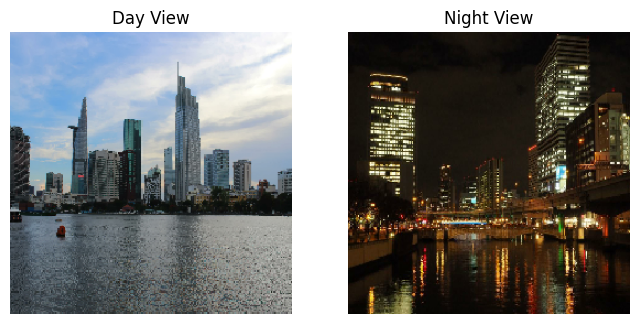

In [ ]:
# 이미지 시각화
plt.figure(figsize=(8, 8))

# 낮뷰 이미지
plt.subplot(1, 2, 1)
plt.imshow(reverse(sample_daycity[0]))
plt.title("Day View")
plt.axis('off')

# 밤뷰 이미지
plt.subplot(1, 2, 2)
plt.imshow(reverse(sample_nightcity[0]))
plt.title("Night View")
plt.axis('off')

plt.show()

In [ ]:
sample_daycity.shape
sample_nightcity.shape

TensorShape([16, 256, 256, 3])

In [ ]:
# 생성자 모델 정의
OUTPUT_CHANNELS = 3  # RGB 이미지를 생성하기 위해 출력 채널 수를 3으로 설정합니다.
# 낮뷰에서 밤뷰로 변환하는 생성자
generator_g = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
# 밤뷰에서 낮뷰로 변환하는 생성자
generator_f = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')


# 판별자 모델 정의
# 낮뷰 판별자
discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
# 밤뷰 판별자
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

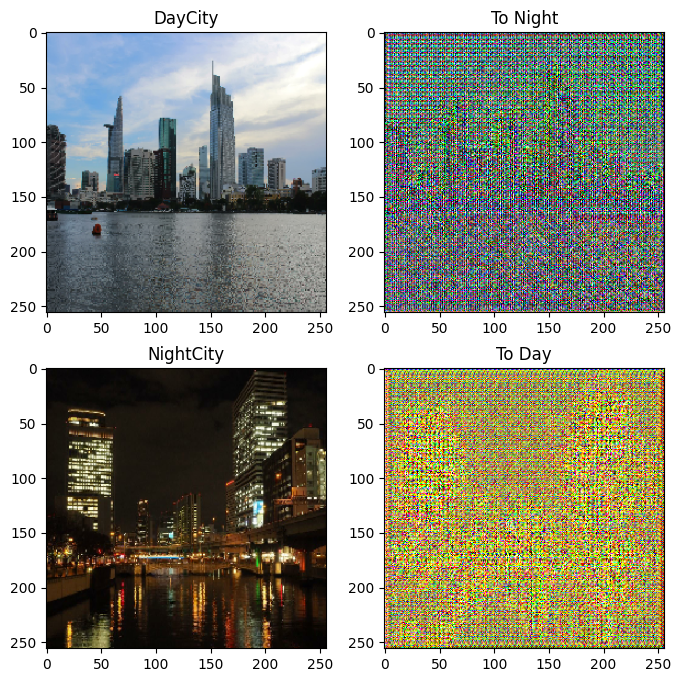

In [ ]:
# 샘플 이미지로 생성자 모델 테스트
to_night = generator_g(sample_daycity)
to_day = generator_f(sample_nightcity)

# 생성된 이미지 시각화
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_daycity, to_night, sample_nightcity, to_day]
title = ['DayCity', 'To Night', 'NightCity', 'To Day']

# 원본 이미지와 생성된 이미지를 시각화합니다.
for i in range(len(imgs)):
  plt.subplot(2, 2, i+1)
  plt.title(title[i])
  if i % 2 == 0:
    plt.imshow(imgs[i][0] * 0.5 + 0.5)
  else:
    plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)

plt.show()

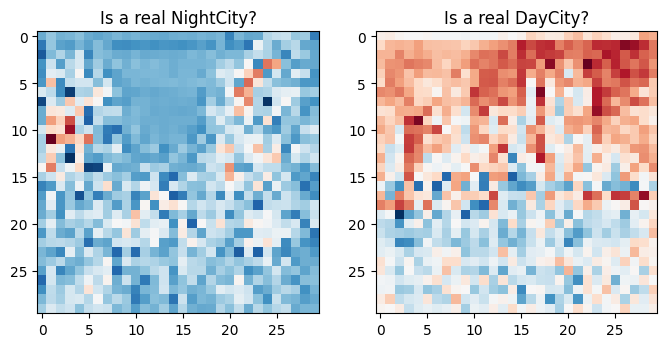

In [ ]:
# 판별자 출력 시각화
plt.figure(figsize=(8, 8))

plt.subplot(121)
plt.title('Is a real NightCity?')
plt.imshow(discriminator_y(sample_nightcity)[0, ..., -1], cmap='RdBu_r')

plt.subplot(122)
plt.title('Is a real DayCity?')
plt.imshow(discriminator_x(sample_daycity)[0, ..., -1], cmap='RdBu_r')

plt.show()

In [ ]:
LAMBDA = 10

# 이진 교차 엔트로피 손실 함수 정의
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
# 판별자 손실 함수
def discriminator_loss(real, generated):
    #실제 이미지에 대한 손실 계산: 실제 이미지는 1 (진짜)로 라벨링
    real_loss = loss_obj(tf.ones_like(real), real)

    # 생성된 이미지에 대한 손실 계산: 생성된 이미지는 0 (가짜)로 라벨링
    generated_loss = loss_obj(tf.zeros_like(generated), generated)

     # 총 판별자 손실을 계산: 실제 이미지 손실과 생성된 이미지 손실의 합
    total_disc_loss = real_loss + generated_loss  # 두 손실을 합하여 총 손실 계산

    # 최종 손실은 평균을 내어 반환
    return total_disc_loss * 0.5  # 총 손실의 절반을 취함으로써 판별자의 전체적인 손실 평균을 구함

In [ ]:
# 생성자 손실 함수
def generator_loss(generated): # 입력 : 판별자 출력 값
  return loss_obj(tf.ones_like(generated), generated)

In [ ]:
# 원본 이미지와 순환 이미지 사이의 주기 일관성 손실을 계산하는 함수
def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

  return LAMBDA * loss1

In [ ]:
def identity_loss(real_image, same_image):
# 원본 이미지와 순환된 이미지 사이의 절대 차이를 평균하여 계산
  loss = tf.reduce_mean(tf.abs(real_image - same_image))

  # 계산된 손실에 일관성 손실 가중치(LAMBDA)를 곱해 최종 손실을 반환
  # 생성자는 여러 손실의 합을 사용하기 때문에 LAMGDA를 이용해 LAMBDA는 손실의 중요도를 조절
  return LAMBDA * 0.5 * loss

In [ ]:
# 생성기 및 판별기 옵티마이저 초기화
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
# 체크포인트 설정
checkpoint_path = "./checkpoints/train"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

# 'max_to_keep=5'는 최대 5개의 최근 체크포인트만 유지한다는 것을 의미합니다.
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# 체크포인트가 존재하는 경우, 가장 최근 체크포인트를 복원
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print('최신 체크포인트가 복원되었습니다!!')

최신 체크포인트가 복원되었습니다!!


In [ ]:
def generate_images(model, test_input):
    '''
    모델을 사용하여 입력 이미지로부터 예측 이미지를 생성하고 시각화하는 함수입니다.
    '''
# 모델에 테스트 입력을 넣어 예측 결과를 얻습니다.
    prediction = model(test_input)

    # 시각화를 위해 12x12 크기의 그래프를 설정합니다.
    plt.figure(figsize=(12, 12))

    # 입력 이미지와 예측 이미지를 표시할 목록입니다.
    display_list = [test_input[0], prediction[0]]
    title = ['Input Image', 'Predicted Image']

    # 입력 이미지와 예측 이미지를 순서대로 플롯합니다.
    for i in range(2):
        plt.subplot(1, 2, i+1)
        plt.title(title[i])
        # 이미지의 픽셀 값을 [0, 1] 범위로 조정하여 표시합니다.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

In [ ]:
def save_generated_images(generator, sample_input, epoch, output_dir='generated_images', mode='day_to_night'):
    """
    주어진 생성자 모델로 이미지를 생성하고, 파일로 저장하는 함수입니다.
    """
    # 생성된 이미지를 생성
    generated_image = generator(sample_input, training=False)

    # 이미지를 0-1 범위로 변환
    generated_image = (generated_image + 1) / 2.0  # [-1, 1] -> [0, 1]

    # 출력 디렉토리가 없으면 생성
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # 이미지를 저장할 파일 경로 설정
    file_path = os.path.join(output_dir, f"{mode}_epoch_{epoch}.png")

    # 이미지 저장
    plt.figure(figsize=(8, 8))
    plt.imshow(generated_image[0])  # 한 이미지만 저장 (배치 크기 1인 경우)
    plt.axis('off')  # 축 제거
    plt.savefig(file_path)
    plt.close()
    print(f"에포크 {epoch}: {mode} 이미지 저장됨 -> {file_path}")

In [ ]:
@tf.function
def train_step(real_x, real_y):
    # 기본적으로 tf.GradientTape는 그라디언트를 한 번만 계산하도록 설정되어 있어 그라디언트를 계산한 후에는 자동으로 자원을 해제함
    # persistent=True 옵션은 여러 번의 그라디언트 계산 후에도 자동으로 소멸되지 않도록 함
    with tf.GradientTape(persistent=True) as tape:
        # 생성기 G는 X를 Y로 변환합니다.
        # 생성기 F는 Y를 X로 변환합니다.

        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)

        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)

        # 아이덴티티 손실을 위해 same_x와 same_y를 계산합니다.
        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)

        # 판별자 X와 Y에 대한 실제 이미지의 판별 결과를 계산합니다.
        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)

        # 판별자 X와 Y에 대한 가짜 이미지의 판별 결과를 계산합니다.
        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)

        # 손실을 계산합니다.
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)

        # 주기 일관성 손실을 계산합니다.
        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

        # 판별자 X와 Y에 대한 가짜 이미지의 판별 결과를 계산합니다.
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

        # 손실을 계산합니다.
        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

    # 생성자와 판별자의 그라디언트를 계산합니다.
    generator_g_gradients = tape.gradient(total_gen_g_loss,
                                        generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss,
                                        generator_f.trainable_variables)

    discriminator_x_gradients = tape.gradient(disc_x_loss,
                                            discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss,
                                            discriminator_y.trainable_variables)

    # 계산된 그라디언트를 적용하여 최적화를 수행합니다.
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients,
                                            generator_g.trainable_variables))

    generator_f_optimizer.apply_gradients(zip(generator_f_gradients,
                                            generator_f.trainable_variables))

    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))

    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables))

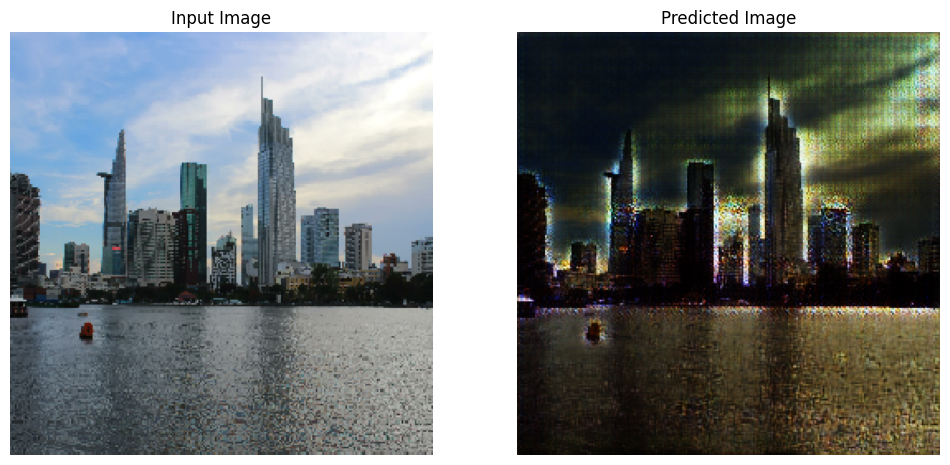

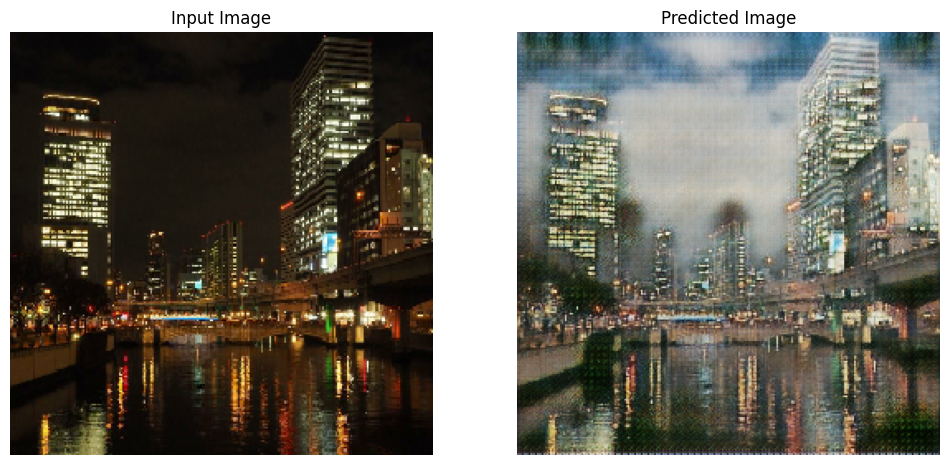

에포크 100에서 체크포인트 저장, 경로: ./checkpoints/train/ckpt-37
에포크 100: day_to_night 이미지 저장됨 -> generated_images/day_to_night_epoch_100.png
에포크 100: night_to_day 이미지 저장됨 -> generated_images/night_to_day_epoch_100.png
에포크 100 완료, 소요 시간: 65.72592854499817초



In [ ]:
for epoch in range(100):
    start = time.time() # 에포크 시작 시간을 기록

    # 이미지 쌍을 처리하는 반복 횟수를 추적하기 위한 카운터
    n = 0
    # 훈련 데이터셋을 불러오고, 낮 이미지와 밤 이미지 쌍을 하나씩 처리
    for image_x, image_y in tf.data.Dataset.zip((train_day_dataset, train_night_dataset)):
        train_step(image_x, image_y)
        # 10번째 스텝마다 진행 상황을 점으로 표시합니다.
        if n % 10 == 0:
            print('.', end='')
        n += 1
    # 현재 출력을 클리어하고 마지막 출력만 유지하여 노트북의 출력을 깔끔하게 합니다.
    clear_output(wait=True)
    # 일관된 이미지 (sample_daycity)를 사용하여 모델의 진행 상황을 명확하게 보여줍니다.
    generate_images(generator_g, sample_daycity)
    generate_images(generator_f, sample_nightcity)

    # 5 epoch마다 체크포인트를 저장합니다.
    if (epoch + 1) % 5 == 0:
        ckpt_save_path = ckpt_manager.save()
        print('에포크 {}에서 체크포인트 저장, 경로: {}'.format(epoch+1,
                                                                ckpt_save_path))
        # 5번의 학습마다 이미지를 저장
        save_generated_images(generator_g, sample_daycity, epoch + 1, mode='day_to_night')
        save_generated_images(generator_f, sample_nightcity, epoch + 1, mode='night_to_day')

    print('에포크 {} 완료, 소요 시간: {}초\n'.format(epoch + 1,
                                                      time.time()-start))

In [ ]:
def load_image(image_path):
    """
    이미지를 로드하고 디코딩하는 함수입니다.
    """
    img_raw = tf.io.read_file(image_path)  # 이미지를 읽어오기
    img = tf.image.decode_png(img_raw, channels=3)  # RGB 이미지로 디코딩 (PNG 포맷을 사용한다고 가정)

    return img

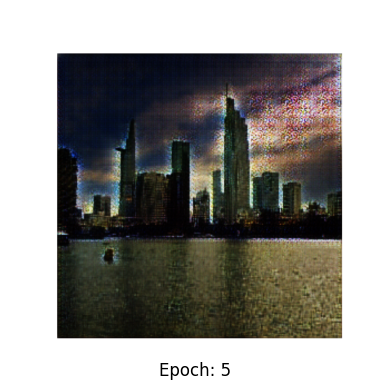

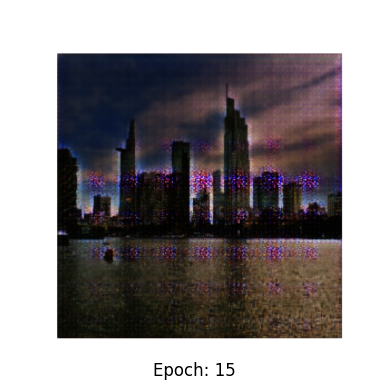

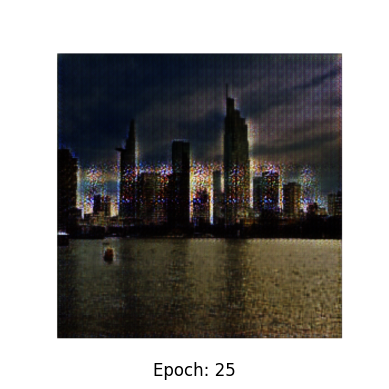

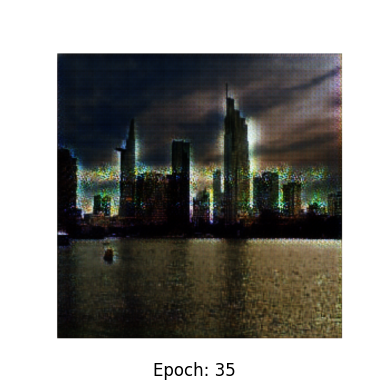

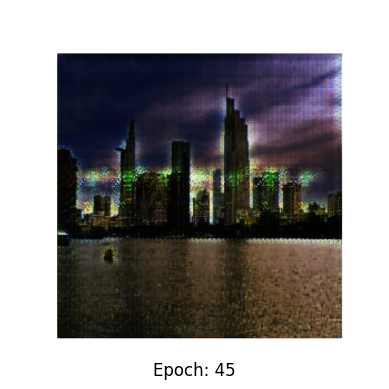

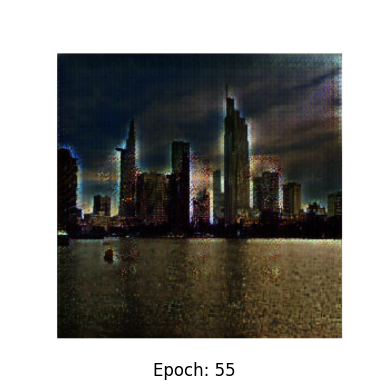

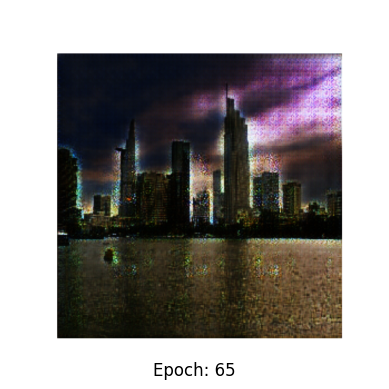

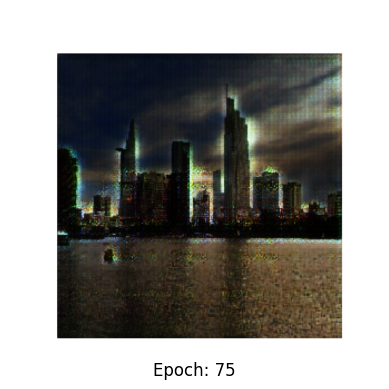

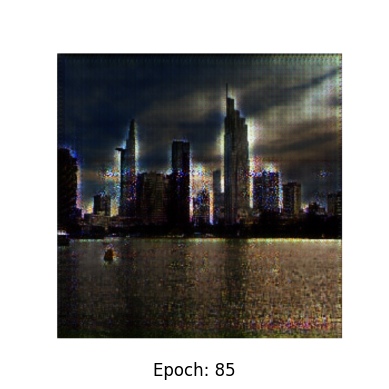

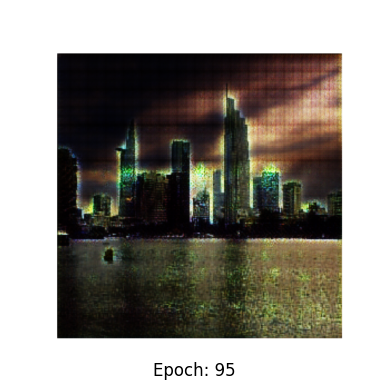

In [ ]:
output_dir = '/content/result_1'
for i in range(5, 101, 10):
  img_path = f'/content/generated_images/day_to_night_epoch_{i}.png'
  image = load_image(img_path)
  plt.imshow(image)
  plt.text(0.5, 0, f'Epoch: {i}', transform=plt.gca().transAxes, ha='center', va='bottom', fontsize=12)
  plt.axis('off')
  plt.show()
  output_path = os.path.join(output_dir, f"day_to_night_epoch_{i}.png")
  plt.savefig(output_path, bbox_inches='tight', pad_inches=0.1)  # 이미지 저장
  plt.close()  # 플롯을 닫음


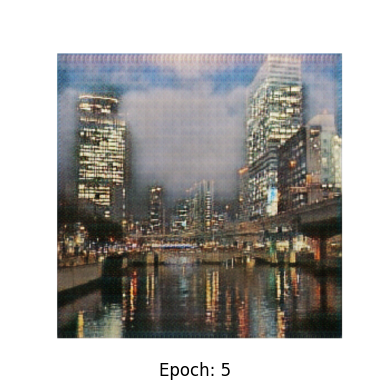

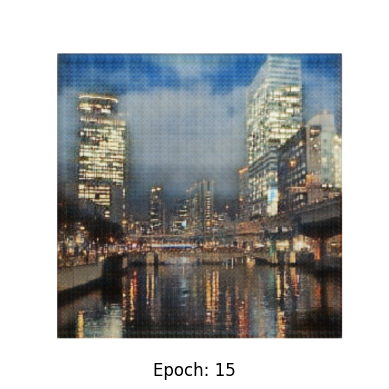

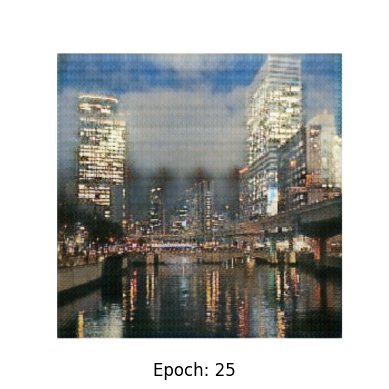

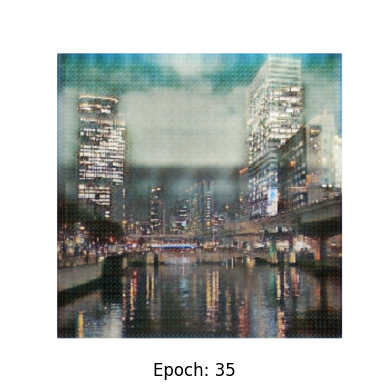

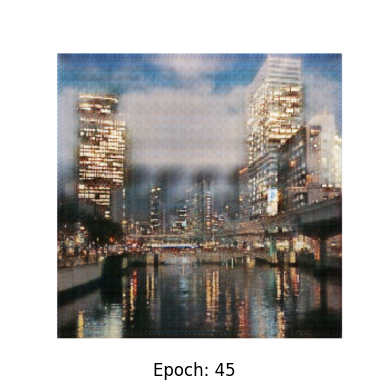

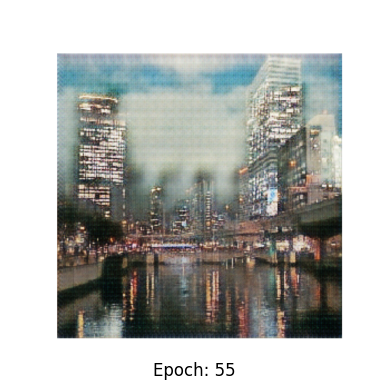

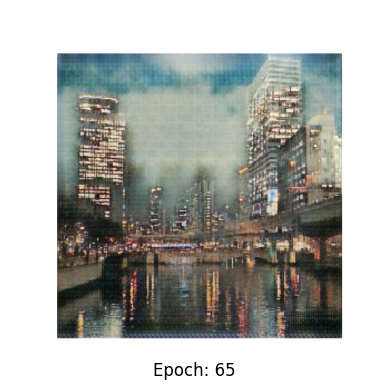

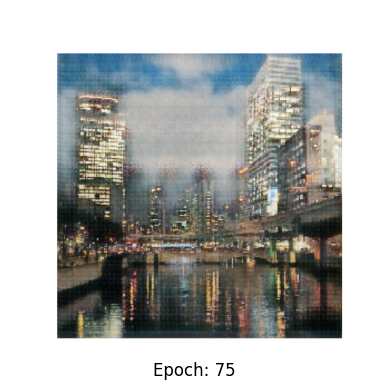

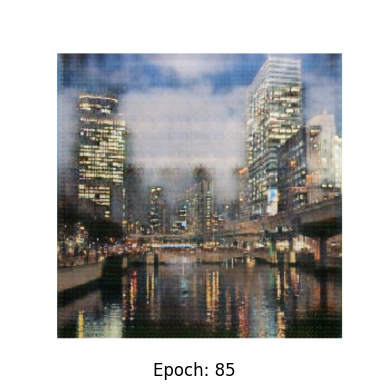

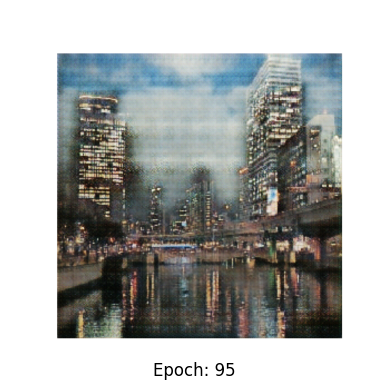

In [ ]:
for i in range(5, 101, 10):
  img_path = f'/content/generated_images/night_to_day_epoch_{i}.png'
  image = load_image(img_path)
  plt.imshow(image)
  plt.text(0.5, 0, f'Epoch: {i}', transform=plt.gca().transAxes, ha='center', va='bottom', fontsize=12)
  plt.axis('off')
  plt.show()

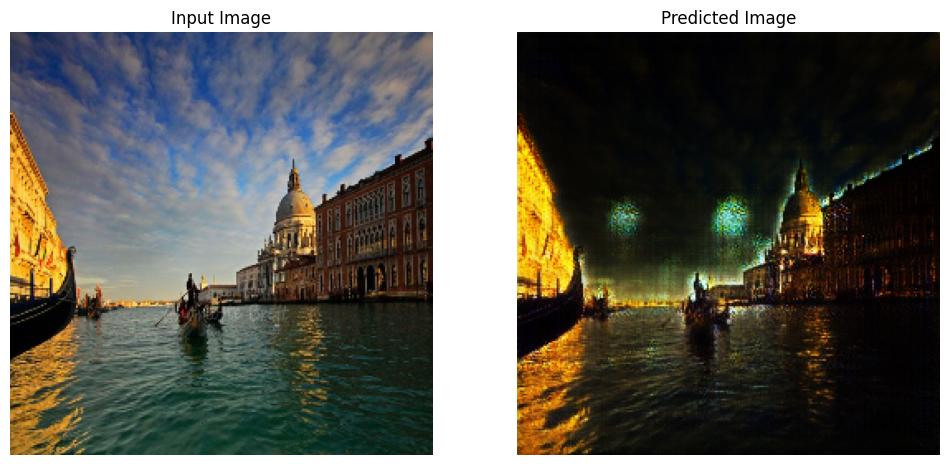

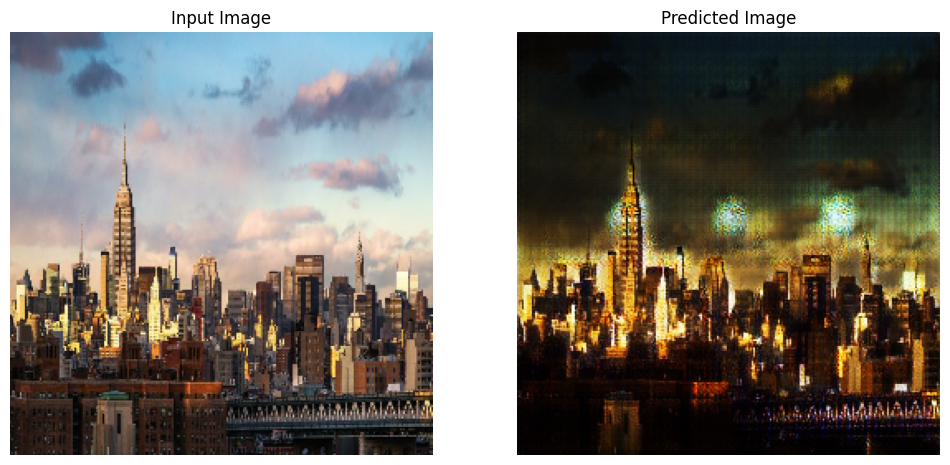

In [ ]:
# 훈련된 모델을 테스트 데이터셋에서 활용
for inp in test_day_dataset.take(2):
  generate_images(generator_g, inp)

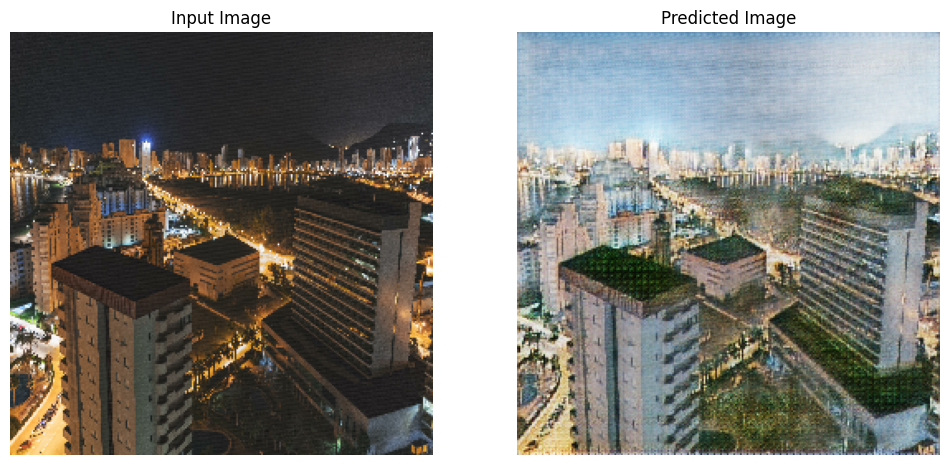

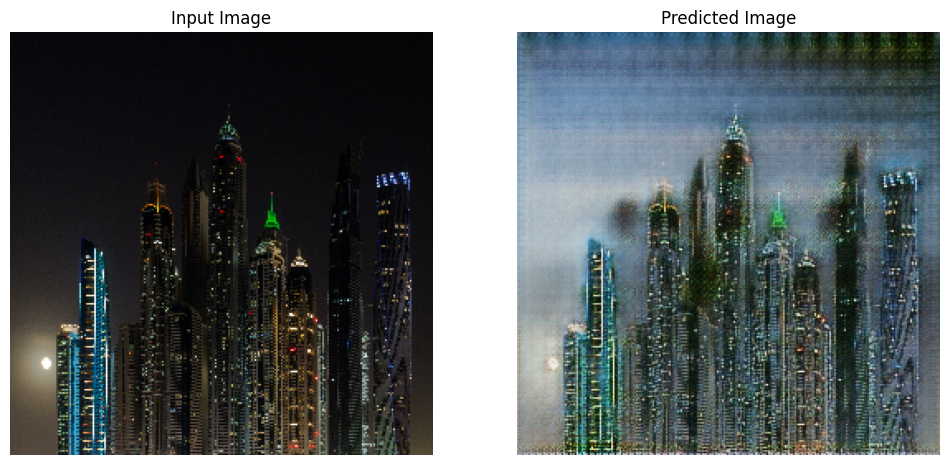

In [ ]:
for inp in test_night_dataset.take(2):
  generate_images(generator_f, inp)

In [ ]:
# 인터넷 이미지 테스트를 위한 전처리 함수
def load_and_preprocess_image(image_path, img_size=(256, 256)):
    """
    tf.io.read_file과 tf.image.decode_jpeg를 사용하여 이미지를 로드하고, 크기를 조정한 후 텐서로 변환하는 함수입니다.
    """
    # 이미지 파일을 읽어 텐서로 디코딩
    img_raw = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img_raw, channels=3)  # 3채널 이미지로 디코딩 (RGB)

    # 이미지 크기 조정
    img = tf.image.resize(img, img_size)  # (256, 256) 크기로 리사이즈

    # 이미지를 [-1, 1] 범위로 정규화
    img = (img / 127.5) - 1

    # 배치 차원 추가
    img = tf.expand_dims(img, axis=0)  # 배치 차원 추가 (배치 크기 1)

    return img

In [ ]:
img_1 = '/content/sample_data/06P02903Aa42000.jpg'
img_2 = '/content/sample_data/YWSABy59SbTm6r4d0PRxPLKp6QCfLt2C_ZGr2ZmL1LbxNbWu4BirdfE8B_t9js3WkSyt_PbSGWPdcuceCEW7QQ.jpg'

# 이미지를 로드하여 텐서로 변환
sample_daycity = load_and_preprocess_image(img_1)
sample_nightcity = load_and_preprocess_image(img_2)

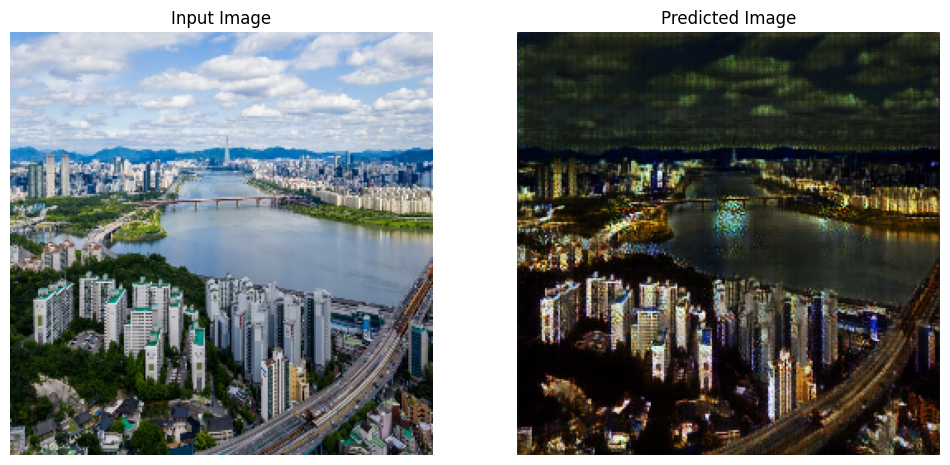

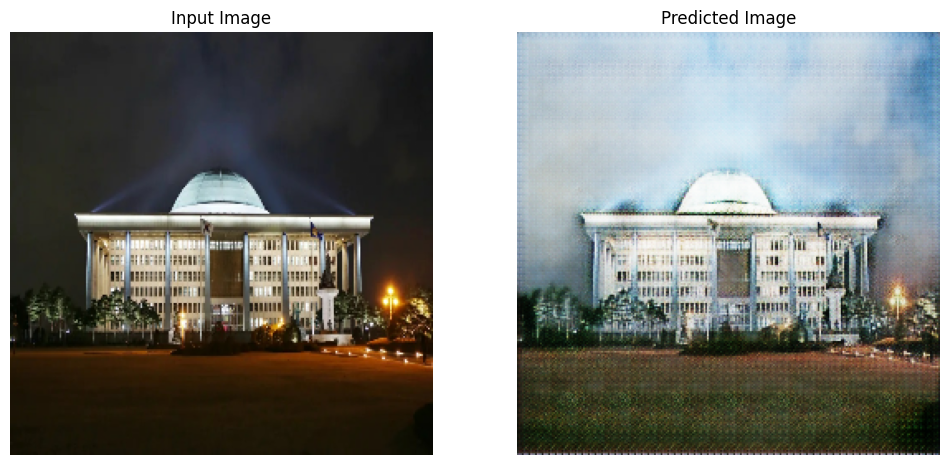

In [ ]:
generate_images(generator_g, sample_daycity)
generate_images(generator_f, sample_nightcity)